# Stacking 6 years of imagery into a GIF

We'll load all the [Landsat-8 (Collection 2, Level 2)](https://planetarycomputer.microsoft.com/dataset/landsat-8-c2-l2) data that's available from [Microsoft's Planetary Computer](https://planetarycomputer.microsoft.com/) over a small region on the coast of [Cape Cod](https://www.google.com/maps/place/Chatham,+MA/@41.7498076,-70.2026227,10.73z/data=!4m13!1m7!3m6!1s0x89fb15440149e94d:0x1f9c0efa001cb20b!2sCape+Cod!3b1!8m2!3d41.6687897!4d-70.2962408!3m4!1s0x89fb142168afbe53:0x714436ec7d485a53!8m2!3d41.6821432!4d-69.9597359), Massachusetts, USA.


Using nothing but standard xarray syntax, we'll mask cloudy pixels with the Landsat QA band and reduce the data down to biannual median composites.

Animated as a GIF, we can watch the coastline move over the years due to [longshore drift](https://en.wikipedia.org/wiki/Longshore_drift).

Planetary Computer is Microsoft's open Earth data initiative. It's particularly nice to use, since they also maintain a [STAC API](https://planetarycomputer.microsoft.com/docs/quickstarts/reading-stac/) for searching all the data, as well as a browseable [data catalog](https://planetarycomputer.microsoft.com/catalog). It's free for anyone to use, though you have to [sign your requests](https://planetarycomputer.microsoft.com/docs/concepts/sas/) with the `planetary_computer` package to prevent abuse. If you [sign up](https://planetarycomputer.microsoft.com/account/request), you'll get faster reads.

In [1]:
import coiled
import distributed
import dask
import pystac_client
import planetary_computer as pc
import ipyleaflet
import IPython.display as dsp
import stackstac

Using a cluster will make this _much_ faster. Particularly if you're not in Europe, which is where this data is stored.

You can sign up for a Coiled account and run clusters for free at https://cloud.coiled.io/ — no credit card or username required, just sign in with your GitHub or Google account.

In [ ]:
deps = !poetry export --without-hashes -E binder | grep -v stackstac
deps += ["git+https://github.com/gjoseph92/stackstac.git@1b838faf4b346538d553f105381b245116952b61#egg=stackstac[viz]"]

coiled.create_software_environment(
    name="stackstac-dev",
    pip=deps,
    backend_options={"region": "eu-central-1"},
)

In [180]:
cluster = coiled.Cluster(
    name="stackstac",
    software="stackstac-dev",
    backend_options={"region": "eu-central-1"},
    # ^ Coiled doesn't yet support Azure's West Europe region, so instead we'll run on a nearby AWS data center in Frankfurt
    n_workers=20,
)
client = distributed.Client(cluster)
client

Output()

Checking environment images
Valid environment image found


/Users/gabe/Library/Caches/pypoetry/virtualenvs/stackstac-FdRcOknL-py3.8/lib/python3.8/site-packages/distributed/client.py:1140: VersionMismatchWarning: Mismatched versions found

+---------+---------------+---------------+---------------+
| Package | client        | scheduler     | workers       |
+---------+---------------+---------------+---------------+
| python  | 3.8.7.final.0 | 3.8.8.final.0 | 3.8.8.final.0 |
+---------+---------------+---------------+---------------+
  warnings.warn(version_module.VersionMismatchWarning(msg[0]["warning"]))


Client Scheduler: tls://ec2-3-66-221-212.eu-central-1.compute.amazonaws.com:8786 Dashboard: http://ec2-3-66-221-212.eu-central-1.compute.amazonaws.com:8787,Cluster Workers: 20 Cores: 80 Memory: 320.00 GiB


Interactively pick the area of interest from a map. Just move the map around and re-run all cells to generate the timeseries somewhere else!

In [4]:
m = ipyleaflet.Map(scroll_wheel_zoom=True)
m.center = 41.64933994767867, -69.94438630063088
m.zoom = 12
m.layout.height = "800px"
m

Map(center=[41.64933994767867, -69.94438630063088], controls=(ZoomControl(options=['position', 'zoom_in_text',…

In [306]:
(m.west, m.south, m.east, m.north)

(-70.05487089045347, 41.59659777453696, -69.8481905926019, 41.69921590764708)

In [5]:
bbox = (m.west, m.south, m.east, m.north)

## Search for STAC items

Use [pystac-client](https://github.com/stac-utils/pystac-client) to connect to Microsoft's STAC API endpoint and search for Landsat-8 scenes.

In [6]:
catalog = pystac_client.Client.open('https://planetarycomputer.microsoft.com/api/stac/v1')

search = catalog.search(
    collections=['landsat-8-c2-l2'],
    bbox=bbox,
)
search.matched()

345

In [7]:
%%time
items = search.items_as_collection()

CPU times: user 757 ms, sys: 51.1 ms, total: 808 ms
Wall time: 18.2 s


Sign all the STAC items with a token from Planetary Computer. Without this, loading the data will fail.

In [8]:
items = pystac_client.ItemCollection([pc.sign_assets(item) for item in items.features])

These are the footprints of all the items we'll use:

In [9]:
dsp.GeoJSON(items.to_dict())

<IPython.display.GeoJSON object>

## Create an xarray with stacksatc

Set `bounds_latlon=bbox` to automatically clip to our area of interest (instead of using the full footprints of the scenes).

In [10]:
%%time
stack = stackstac.stack(items, bounds_latlon=bbox)
stack

CPU times: user 268 ms, sys: 10.9 ms, total: 278 ms
Wall time: 276 ms


,Array,Chunk
Bytes,43.74 GiB,6.05 MiB
Shape,"(345, 19, 774, 1157)","(1, 1, 774, 1024)"
Count,26222 Tasks,13110 Chunks
Type,float64,numpy.ndarray


And that's it for stackstac! Everything from here on is just standard xarray operations.

In [11]:
# use common_name for bands
stack = stack.assign_coords(band=stack.common_name.fillna(stack.band).rename("band"))
stack.band

<xarray.DataArray 'band' (band: 19)>
array(['QA_PIXEL', 'QA_RADSAT', 'coastal', 'blue', 'green', 'red', 'nir08',
       'swir16', 'swir22', 'SR_B8', 'lwir11', 'ST_ATRAN', 'ST_CDIST',
       'ST_DRAD', 'ST_URAD', 'ST_TRAD', 'ST_EMIS', 'ST_EMSD', 'ST_QA'],
      dtype=object)
Coordinates: (12/15)
  * band                       (band) object 'QA_PIXEL' 'QA_RADSAT' ... 'ST_QA'
    proj:epsg                  int64 32619
    platform                   <U9 'landsat-8'
    landsat:collection_number  <U2 '02'
    description                (band) <U91 'Collection 2 Level-1 Pixel Qualit...
    landsat:processing_level   <U4 'L2SP'
    ...                         ...
    view:off_nadir             int64 0
    title                      (band) <U46 'Pixel Quality Assessment Band' .....
    gsd                        (band) object None None None ... 30.0 30.0 30.0
    common_name                (band) object None None 'coastal' ... None None
    center_wavelength          (band) object None None 0.44 ... None None None
    full_width_half_max        (band) object None None 0.02 ... None None None

See how much input data there is for just RGB. This is the amount of data we'll end up processing

In [12]:
stack.sel(band=["red", "green", "blue"])

,Array,Chunk
Bytes,6.91 GiB,6.05 MiB
Shape,"(345, 3, 774, 1157)","(1, 1, 774, 1024)"
Count,28292 Tasks,2070 Chunks
Type,float64,numpy.ndarray


## Mask cloudy pixels using the QA band

Use the bit values of the Landsat-8 QA band to mask out bad pixels. We'll mask pixels labeled as dilated cloud, cirrus, cloud, or cloud shadow. (By "mask", we mean just replacing those pixels with NaNs).

See page 14 on [this PDF](https://prd-wret.s3.us-west-2.amazonaws.com/assets/palladium/production/atoms/files/LSDS-1328_Landsat8-9-OLI-TIRS-C2-L2-DFCB-v6.pdf) for the data table describing which bit means what.

In [13]:
# Make a bitmask---when we bitwise-and it with the data, it leaves just the 4 bits we care about
mask_bitfields = [1, 2, 3, 4]  # dilated cloud, cirrus, cloud, cloud shadow
bitmask = 0
for field in mask_bitfields:
    bitmask |= 1 << field

bin(bitmask)

'0b11110'

In [14]:
qa = stack.sel(band="QA_PIXEL").astype("uint16")
bad = qa & bitmask  # just look at those 4 bits

good = stack.where(bad == 0)  # mask pixels where any one of those bits are set

(array([  6., 159., 156.,  20.,   0.,   0.,   2.,   0.,   0.,   1.]),
 array([ 0. ,  3.9,  7.8, 11.7, 15.6, 19.5, 23.4, 27.3, 31.2, 35.1, 39. ]),
 <BarContainer object of 10 artists>)

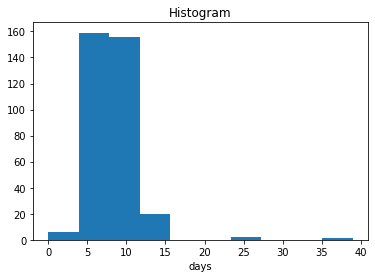

In [15]:
# What's the typical interval between scenes?
good.time.diff("time").dt.days.plot.hist()

## Make biannual median composites

The Landsat-8 scenes appear to typically be 5-10 days apart. Let's composite that down to a 6-month interval.

Since the cloudy pixels we masked with NaNs will be ignored in the `median`, this should give us a decent cloud-free-ish image for each.

In [16]:
# Make biannual median composites (`2Q` means 2 quarters)
composites = good.resample(time="2Q").median("time")
composites

,Array,Chunk
Bytes,2.16 GiB,3.02 MiB
Shape,"(17, 19, 774, 1157)","(1, 1, 774, 512)"
Count,71875 Tasks,969 Chunks
Type,float64,numpy.ndarray


Pick the red-green-blue bands to make a true-color image.

In [17]:
rgb = composites.sel(band=["red", "green", "blue"])
rgb

<xarray.DataArray 'stackstac-13af4e8d700465c631ea18f741010169' (time: 17, band: 3, y: 774, x: 1157)>
dask.array<getitem, shape=(17, 3, 774, 1157), dtype=float64, chunksize=(1, 1, 774, 512), chunktype=numpy.ndarray>
Coordinates:
  * time                       (time) datetime64[ns] 2013-03-31 ... 2021-03-31
  * band                       (band) object 'red' 'green' 'blue'
  * x                          (x) float64 4.04e+05 4.04e+05 ... 4.387e+05
  * y                          (y) float64 4.623e+06 4.623e+06 ... 4.6e+06
    proj:epsg                  int64 32619
    platform                   <U9 'landsat-8'
    landsat:collection_number  <U2 '02'
    landsat:processing_level   <U4 'L2SP'
    landsat:wrs_row            <U3 '031'
    instruments                object {'tirs', 'oli'}
    landsat:wrs_type           <U1 '2'
    view:off_nadir             int64 0

Some final cleanup to make a nicer-looking animation:

* Drop the 2021 dates, since we're not far enough into 2021 yet to have enough scenes for a nice-looking composite.
* Forward-fill any NaN pixels from the previous frame, to make the animation look less jumpy.
* Also skip the first frame, since its NaNs can't be filled from anywhere.

In [27]:
cleaned = rgb.loc[:"2021-01-01"].ffill("time")[1:]

In [28]:
%%time
gif_img = dgif(cleaned).compute()

In [29]:
# we turned ~7GiB of data into a 5MB GIF!
dask.utils.format_bytes(len(gif_img.data))

'5.40 MiB'

In [28]:
gif_img

CPU times: user 1.59 s, sys: 92.7 ms, total: 1.68 s
Wall time: 32.5 s
